In [2]:
import tensorflow as tf
import keras
print(tf.keras.__version__)
print(keras.__version__)

2.1.6-tf
2.2.4


Using TensorFlow backend.


In [3]:
from keras import layers
from keras import models
import numpy as np

In [8]:
generator_input = keras.Input(shape=(100,))

x = layers.Dense(8*16*16*128)(generator_input)
x = layers.LeakyReLU()(x)
x = layers.Reshape((8, 16, 16, 128))(x)
    
x = layers.Conv3DTranspose(64, kernel_size=4, strides=2 , padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv3DTranspose(32, kernel_size=4, strides=2, padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv3DTranspose(16, kernel_size=4, strides=2, padding='same')(x)
x = layers.BatchNormalization()(x)
x = layers.LeakyReLU()(x)

x = layers.Conv3DTranspose(1, kernel_size=4, strides=(1,2,2), activation='tanh', padding='same')(x)

generator = keras.models.Model(generator_input, x)
generator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_4 (InputLayer)         (None, 100)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 262144)            26476544  
_________________________________________________________________
leaky_re_lu_9 (LeakyReLU)    (None, 262144)            0         
_________________________________________________________________
reshape_2 (Reshape)          (None, 8, 16, 16, 128)    0         
_________________________________________________________________
conv3d_transpose_5 (Conv3DTr (None, 16, 32, 32, 64)    524352    
_________________________________________________________________
batch_normalization_7 (Batch (None, 16, 32, 32, 64)    256       
_________________________________________________________________
leaky_re_lu_10 (LeakyReLU)   (None, 16, 32, 32, 64)    0         
__________

In [5]:
discriminator_input = keras.Input(shape=(64, 256, 256, 1))

y = layers.Conv3D(16, kernel_size=4, strides=2, padding='same')(discriminator_input)
y = layers.LeakyReLU()(y)

y = layers.Conv3D(32, kernel_size=4, strides=2, padding='same')(y)
y = layers.BatchNormalization()(y)
y = layers.LeakyReLU()(y)

y = layers.Conv3D(64, kernel_size=4, strides=2, padding='same')(y)
y = layers.BatchNormalization()(y)
y = layers.LeakyReLU()(y)

y = layers.Conv3D(1, kernel_size=4, strides=2, padding='same')(y)
y = layers.BatchNormalization()(y)
y = layers.LeakyReLU()(y)

y = layers.Flatten()(y)
y = layers.Dropout(0.4)(y)
y = layers.Dense(1, activation="sigmoid")(y)

discriminator = keras.models.Model(discriminator_input, y)
discriminator.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_2 (InputLayer)         (None, 64, 256, 256, 1)   0         
_________________________________________________________________
conv3d_1 (Conv3D)            (None, 32, 128, 128, 16)  1040      
_________________________________________________________________
leaky_re_lu_5 (LeakyReLU)    (None, 32, 128, 128, 16)  0         
_________________________________________________________________
conv3d_2 (Conv3D)            (None, 16, 64, 64, 32)    32800     
_________________________________________________________________
batch_normalization_4 (Batch (None, 16, 64, 64, 32)    128       
_________________________________________________________________
leaky_re_lu_6 (LeakyReLU)    (None, 16, 64, 64, 32)    0         
_________________________________________________________________
conv3d_3 (Conv3D)            (None, 8, 32, 32, 64)     131136    
__________

In [5]:
discriminator_optimizer = keras.optimizers.Adam(
    lr=0.001,
    clipvalue=1.0,
    decay=1e-8)

discriminator.compile(optimizer=discriminator_optimizer,
                     loss='binary_crossentropy')

In [6]:
discriminator.trainable = False
gan_input = keras.Input(shape=(100,))
gan_output = discriminator(generator(gan_input))
gan = keras.models.Model(gan_input, gan_output)

gan_optimizer = keras.optimizers.Adam(lr=0.001, clipvalue=1.0, decay=1e-8)
gan.compile(optimizer=gan_optimizer, loss='binary_crossentropy')

In [7]:
%run input_pipeline.ipynb

/home/ubuntu/anaconda3/envs/tensorflow_p36/lib/python3.6/site-packages/keras/engine/training.py:490: UserWarning: Discrepancy between trainable weights and collected trainable weights, did you set `model.trainable` without calling `model.compile` after ?
  'Discrepancy between trainable weights and collected trainable'


0
discriminator loss: 0.93867815
adversarial loss: 0.0009954742


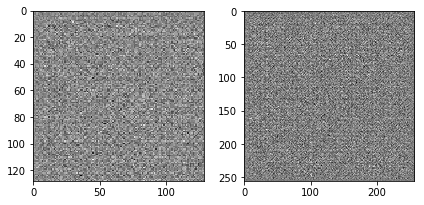

100
discriminator loss: -0.023532355
adversarial loss: 6.876802


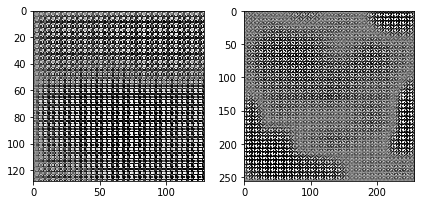

200
discriminator loss: 0.027561545
adversarial loss: 3.453237


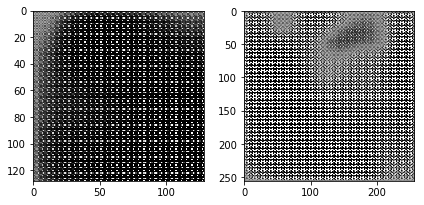

300
discriminator loss: 8.1801416e-05
adversarial loss: 3.807829


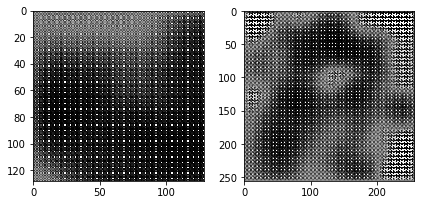

400
discriminator loss: 0.017891694
adversarial loss: 2.6372209


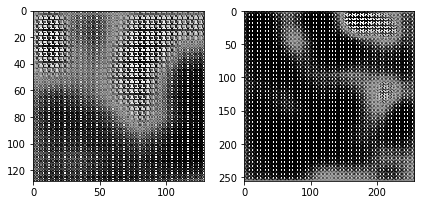

500
discriminator loss: -0.016344111
adversarial loss: 4.215432


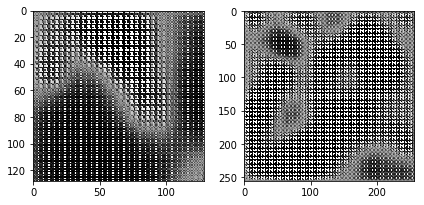

600
discriminator loss: -0.06612752
adversarial loss: 3.8227723


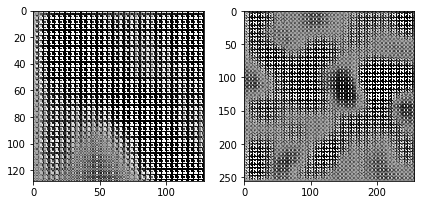

700
discriminator loss: 0.048391074
adversarial loss: 1.6034801


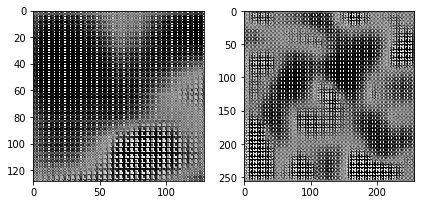

800
discriminator loss: -0.049759142
adversarial loss: 2.424627


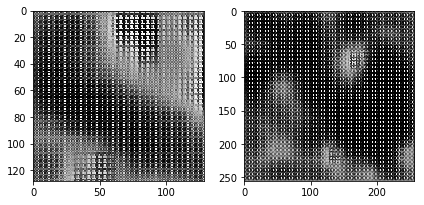

900
discriminator loss: 0.010444999
adversarial loss: 2.1563141


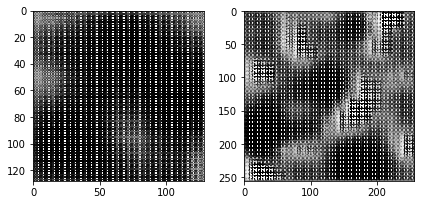

1000
discriminator loss: -0.023637008
adversarial loss: 0.36655194


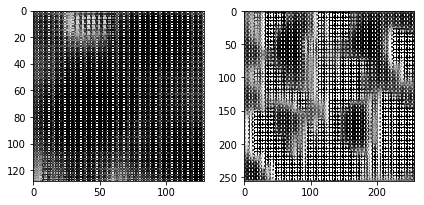

1100
discriminator loss: -0.007896972
adversarial loss: 2.3215457e-06


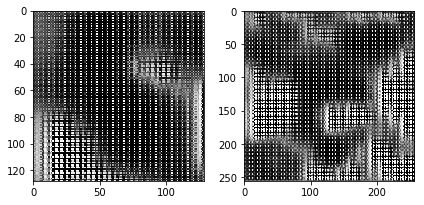

1200
discriminator loss: 0.02432378
adversarial loss: 0.10172717


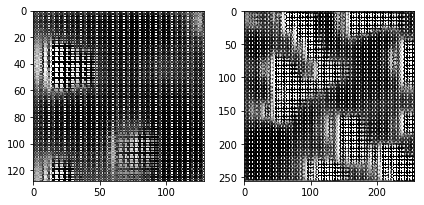

1300
discriminator loss: -0.04736001
adversarial loss: 2.3826758e-05


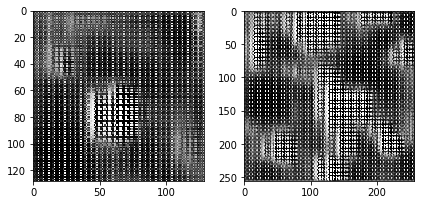

1400
discriminator loss: 0.06127106
adversarial loss: 0.13623133


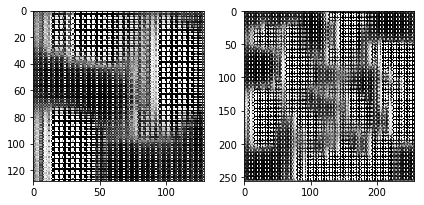

1500
discriminator loss: -0.014569605
adversarial loss: 1.3551993e-07


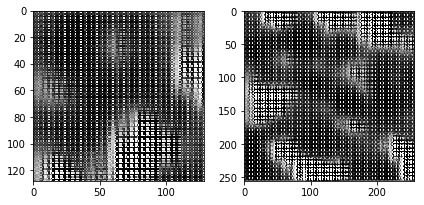

1600
discriminator loss: -0.04662771
adversarial loss: 1.0000001e-07


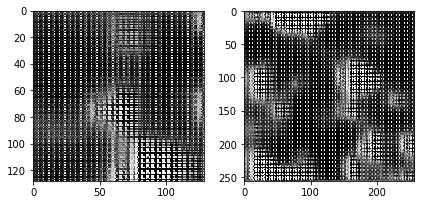

1700
discriminator loss: 0.014112127
adversarial loss: 1.2410099e-05


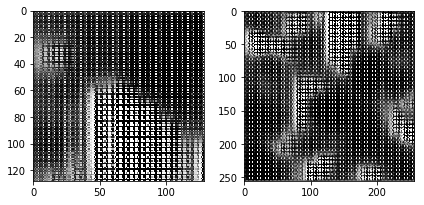

1800
discriminator loss: -0.0028721928
adversarial loss: 1.4890837e-06


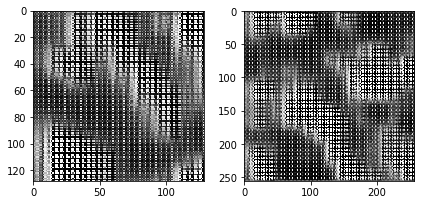

1900
discriminator loss: -0.014711285
adversarial loss: 0.00015985829


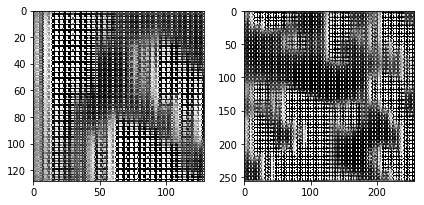

2000
discriminator loss: -0.05818548
adversarial loss: 3.3993238e-05


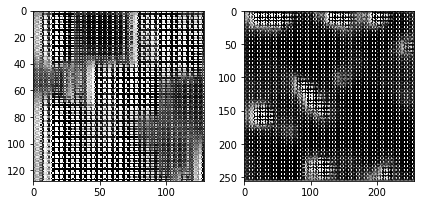

2100
discriminator loss: 0.0007239223
adversarial loss: 6.426809e-05


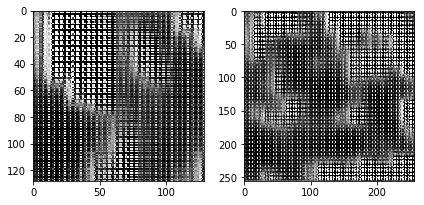

2200
discriminator loss: 0.07172425
adversarial loss: 0.005884448


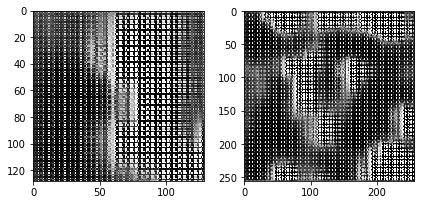

2300
discriminator loss: -0.034920506
adversarial loss: 6.7302484e-05


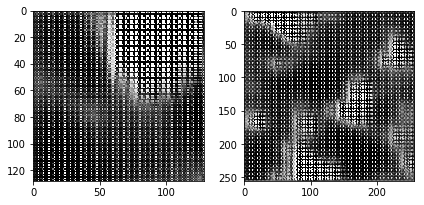

2400
discriminator loss: 0.0232
adversarial loss: 2.0011794e-07


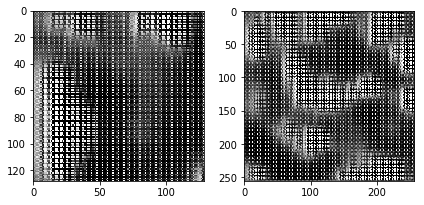

2500
discriminator loss: -0.055645905
adversarial loss: 5.381536e-07


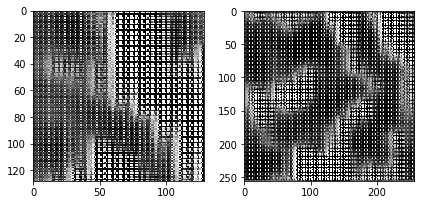

2600
discriminator loss: -0.017688846
adversarial loss: 1.0069884e-07


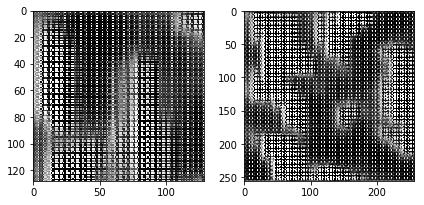

2700
discriminator loss: -0.03260548
adversarial loss: 1.00969466e-07


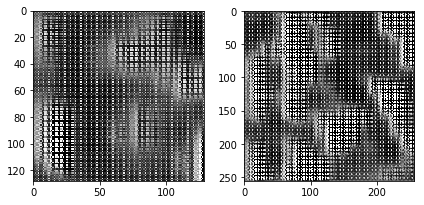

2800
discriminator loss: 0.0056117116
adversarial loss: 1.0000001e-07


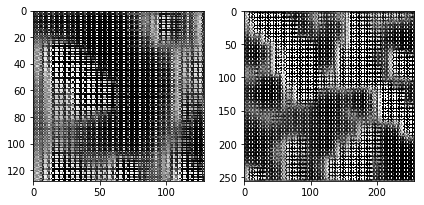

2900
discriminator loss: -0.014409167
adversarial loss: 3.2808026e-07


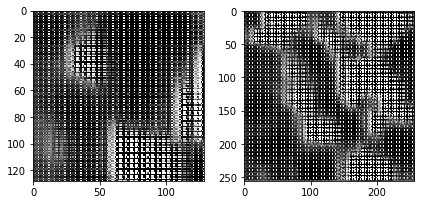

3000
discriminator loss: 0.049445737
adversarial loss: 2.5523773e-06


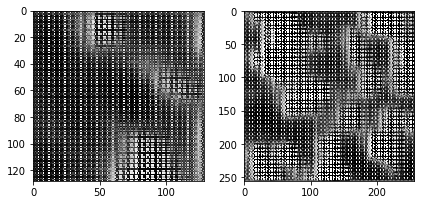

3100
discriminator loss: 0.01988622
adversarial loss: 2.1901289e-05


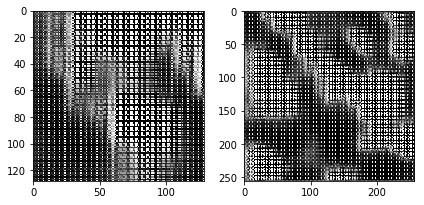

3200
discriminator loss: 0.013768047
adversarial loss: 0.0003541833


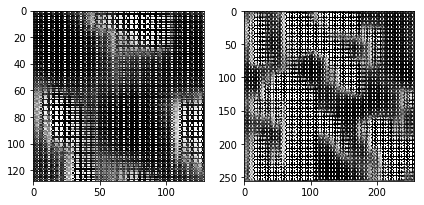

3300
discriminator loss: -0.07821558
adversarial loss: 1.0000001e-07


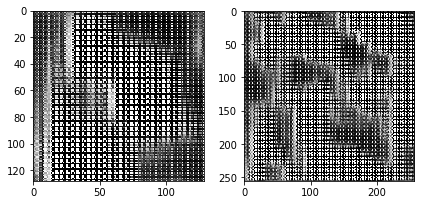

3400
discriminator loss: 0.012325585
adversarial loss: 1.0000001e-07


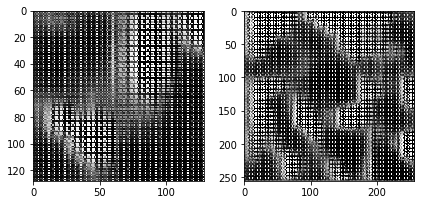

3500
discriminator loss: 0.038280267
adversarial loss: 0.05421841


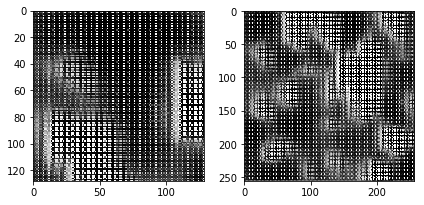

3600
discriminator loss: -0.05228982
adversarial loss: 1.0000001e-07


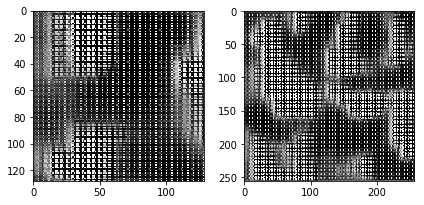

3700
discriminator loss: -0.018449986
adversarial loss: 1.0472699e-07


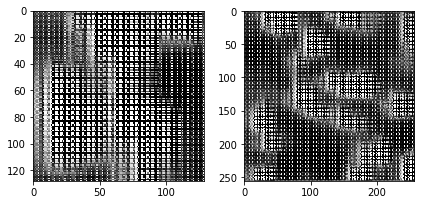

3800
discriminator loss: 0.040201344
adversarial loss: 1.0000001e-07


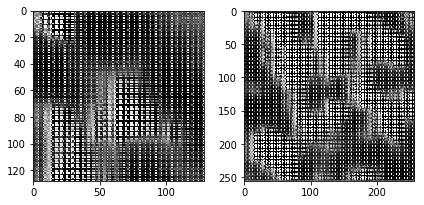

3900
discriminator loss: -0.008955896
adversarial loss: 1.0000001e-07


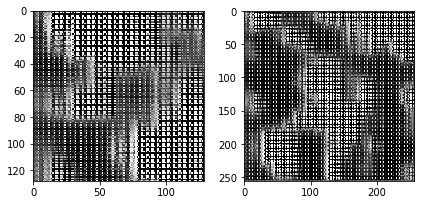

4000
discriminator loss: -0.010059697
adversarial loss: 1.0143357e-07


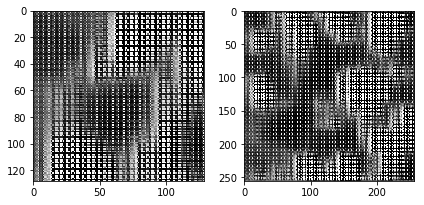

4100
discriminator loss: -0.0060809613
adversarial loss: 1.0000001e-07


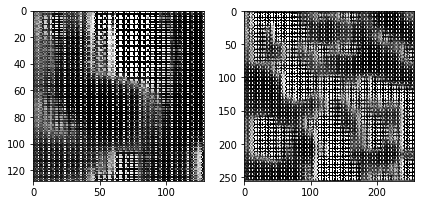

4200
discriminator loss: 0.034523077
adversarial loss: 8.2206753e-07


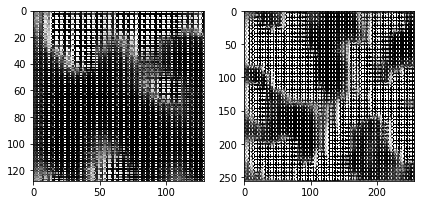

4300
discriminator loss: -0.02064157
adversarial loss: 1.0000001e-07


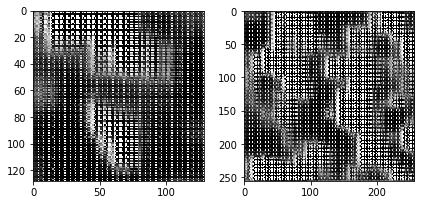

4400
discriminator loss: -0.04347538
adversarial loss: 1.03619e-07


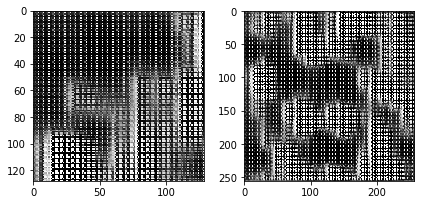

4500
discriminator loss: 0.050748087
adversarial loss: 1.0000001e-07


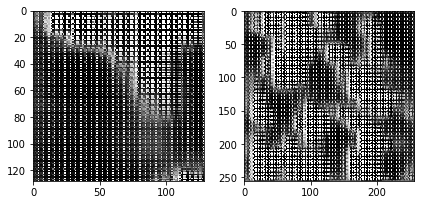

4600
discriminator loss: 0.06473779
adversarial loss: 1.0000001e-07


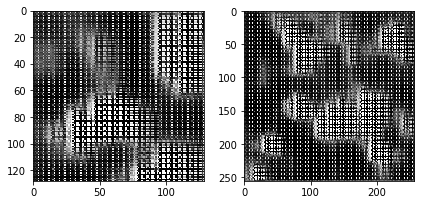

4700
discriminator loss: -0.035154253
adversarial loss: 1.0000001e-07


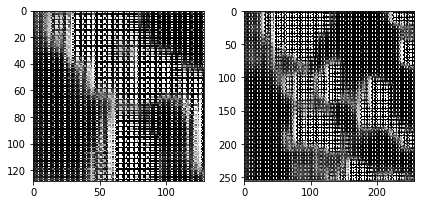

4800
discriminator loss: -0.0055026114
adversarial loss: 5.3493104e-06


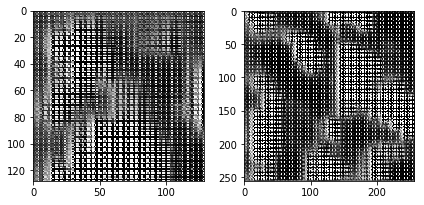

4900
discriminator loss: 0.00908122
adversarial loss: 1.0000001e-07


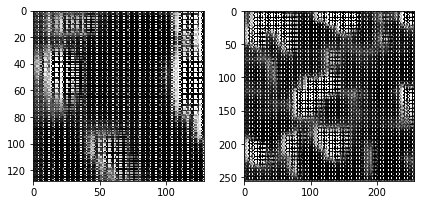

5000
discriminator loss: 0.043860577
adversarial loss: 5.530417e-06


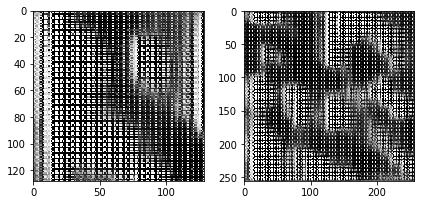

5100
discriminator loss: -0.015909452
adversarial loss: 4.9051073e-07


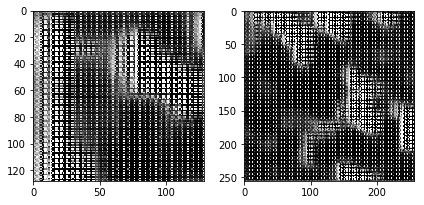

5200
discriminator loss: -0.046259366
adversarial loss: 1.6420168e-07


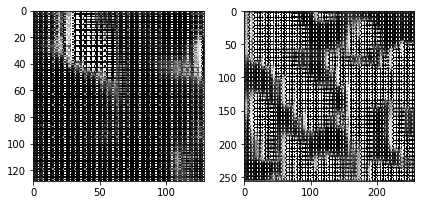

5300
discriminator loss: -0.026563585
adversarial loss: 1.0000001e-07


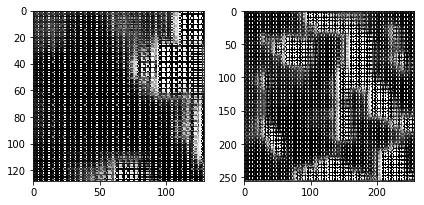

5400
discriminator loss: -0.02578925
adversarial loss: 1.0000001e-07


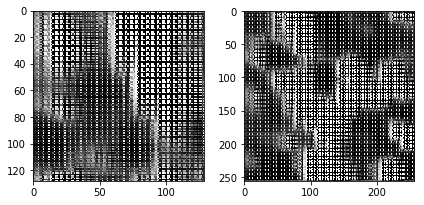

5500
discriminator loss: 0.008020198
adversarial loss: 2.3104747e-07


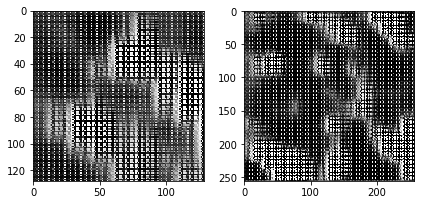

5600
discriminator loss: -0.02725705
adversarial loss: 1.01003444e-07


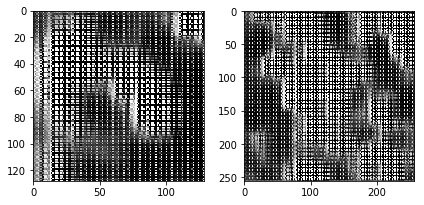

5700
discriminator loss: -0.024640167
adversarial loss: 1.0000001e-07


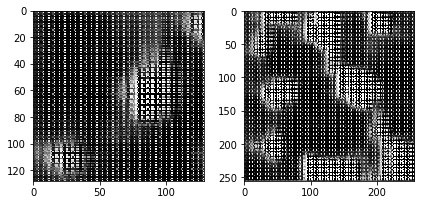

5800
discriminator loss: -0.027484095
adversarial loss: 1.8993764e-07


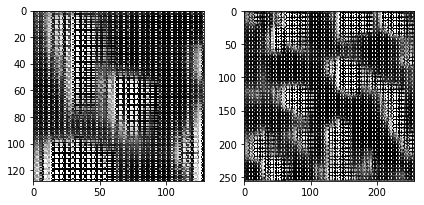

5900
discriminator loss: 0.0017743468
adversarial loss: 1.0000001e-07


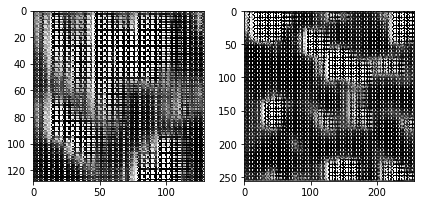

6000
discriminator loss: 0.009131879
adversarial loss: 1.0000001e-07


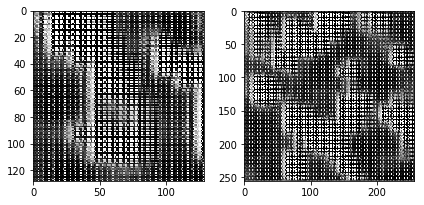

6100
discriminator loss: -0.07699138
adversarial loss: 1.102808e-07


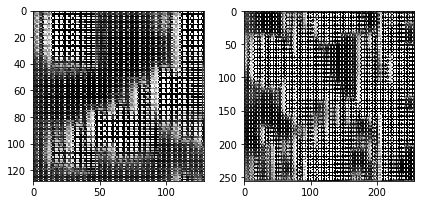

6200
discriminator loss: -0.069079235
adversarial loss: 1.0000001e-07


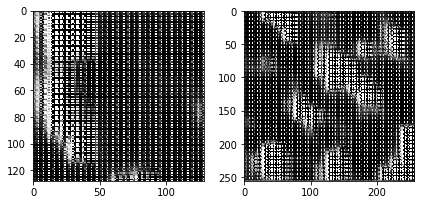

6300
discriminator loss: -0.031360198
adversarial loss: 0.4871769


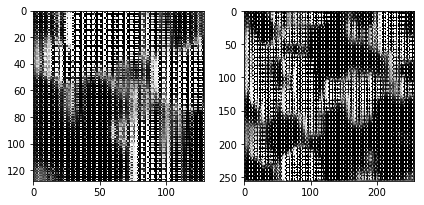

6400
discriminator loss: 0.030115653
adversarial loss: 2.7521291e-06


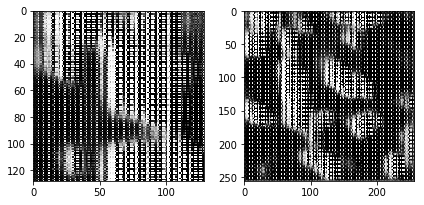

6500
discriminator loss: -0.044872086
adversarial loss: 1.0237468e-07


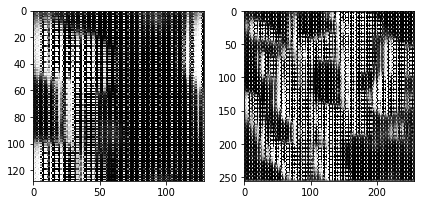

6600
discriminator loss: -0.006675196
adversarial loss: 1.0000001e-07


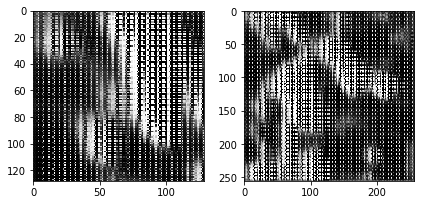

6700
discriminator loss: 0.012781918
adversarial loss: 1.0000001e-07


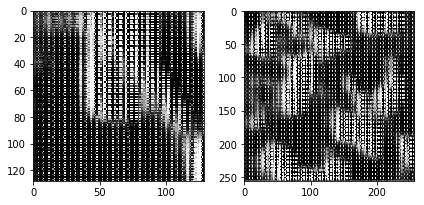

6800
discriminator loss: -0.040762812
adversarial loss: 1.0920087e-07


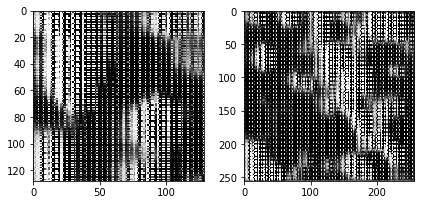

6900
discriminator loss: -0.03500681
adversarial loss: 1.04066956e-07


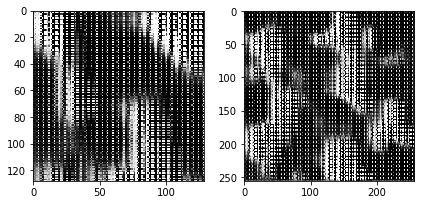

7000
discriminator loss: 0.06607066
adversarial loss: 1.0000001e-07


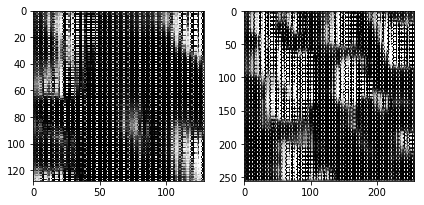

7100
discriminator loss: -0.03455838
adversarial loss: 1.0000001e-07


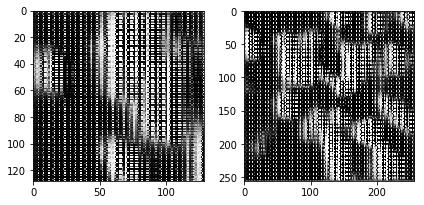

7200
discriminator loss: 0.042245306
adversarial loss: 1.0000001e-07


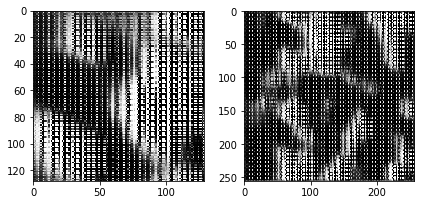

7300
discriminator loss: 0.063416384
adversarial loss: 1.12921136e-07


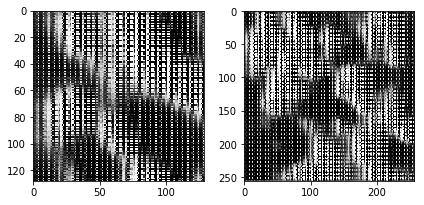

7400
discriminator loss: -0.04116739
adversarial loss: 1.0000001e-07


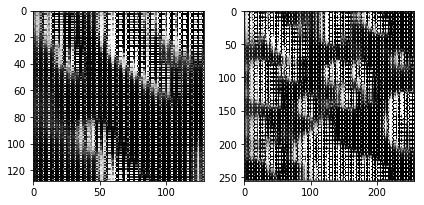

7500
discriminator loss: -0.014181519
adversarial loss: 1.0000001e-07


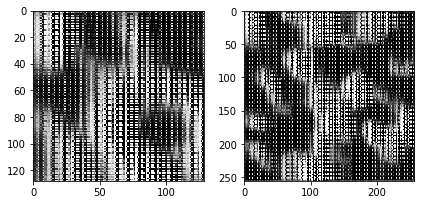

7600
discriminator loss: -0.044715203
adversarial loss: 9.734822e-06


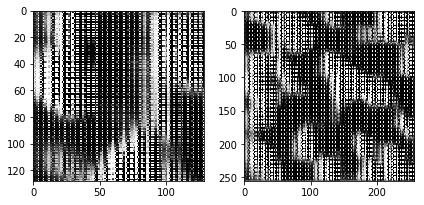

7700
discriminator loss: -0.058980472
adversarial loss: 1.0000001e-07


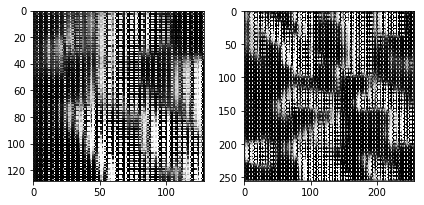

7800
discriminator loss: 0.021931136
adversarial loss: 1.0000001e-07


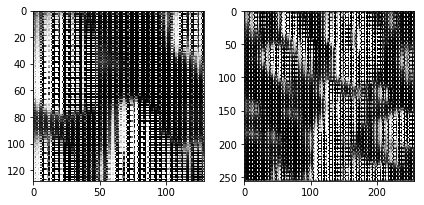

7900
discriminator loss: 0.011059642
adversarial loss: 1.0000001e-07


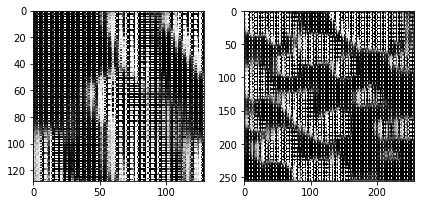

8000
discriminator loss: -6.5779685e-05
adversarial loss: 1.0000001e-07


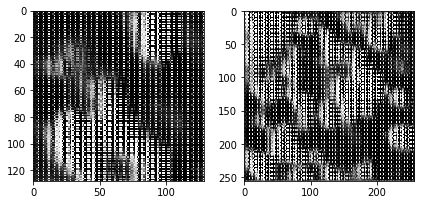

8100
discriminator loss: -0.022236776
adversarial loss: 1.0256267e-07


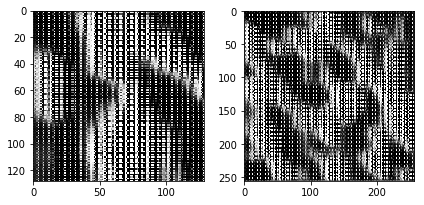

8200
discriminator loss: -0.012515289
adversarial loss: 1.0000001e-07


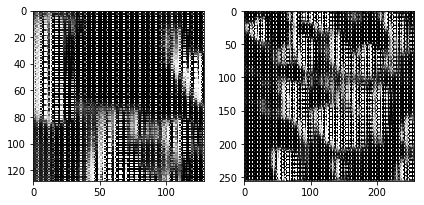

8300
discriminator loss: 0.072959885
adversarial loss: 1.7958969e-07


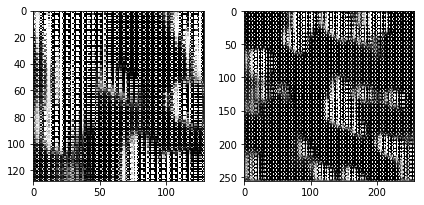

8400
discriminator loss: -0.018327093
adversarial loss: 0.00015278565


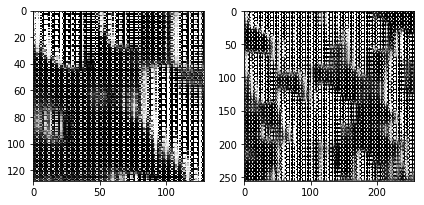

8500
discriminator loss: 0.023156632
adversarial loss: 1.0000001e-07


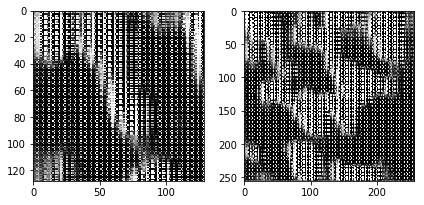

8600
discriminator loss: 0.030411184
adversarial loss: 1.2369394


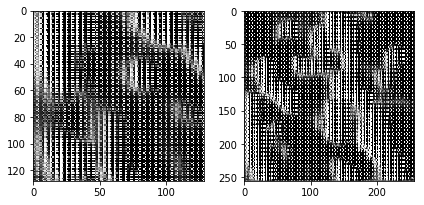

8700
discriminator loss: 0.009085393
adversarial loss: 1.0000001e-07


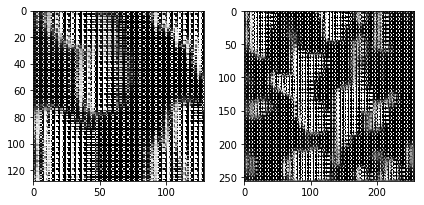

8800
discriminator loss: 0.038021564
adversarial loss: 1.0000001e-07


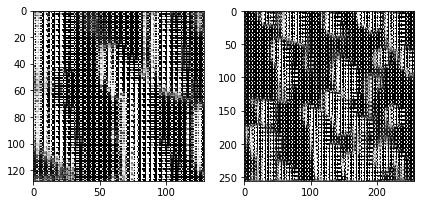

8900
discriminator loss: 0.03501106
adversarial loss: 1.0000001e-07


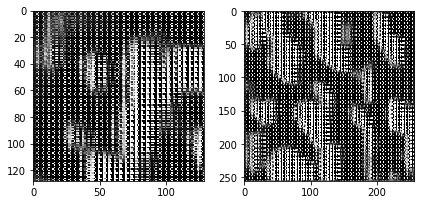

9000
discriminator loss: -0.0155224325
adversarial loss: 8.448795e-07


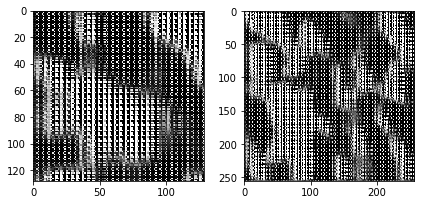

9100
discriminator loss: -0.025558699
adversarial loss: 1.0000001e-07


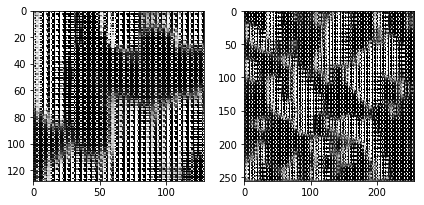

9200
discriminator loss: 0.06027464
adversarial loss: 1.0000001e-07


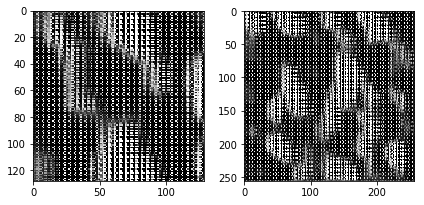

9300
discriminator loss: -0.023925185
adversarial loss: 1.0000001e-07


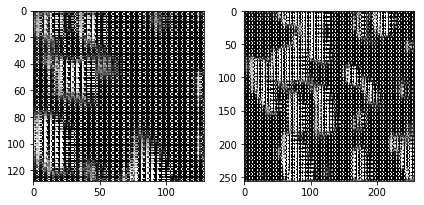

9400
discriminator loss: 0.053666085
adversarial loss: 1.0000001e-07


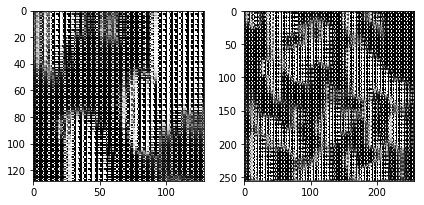

9500
discriminator loss: 0.0043946328
adversarial loss: 1.0000001e-07


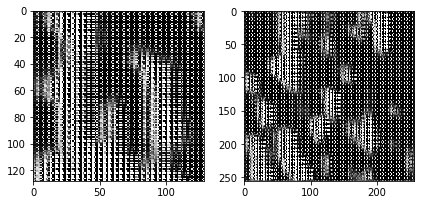

9600
discriminator loss: -0.036947824
adversarial loss: 1.0000001e-07


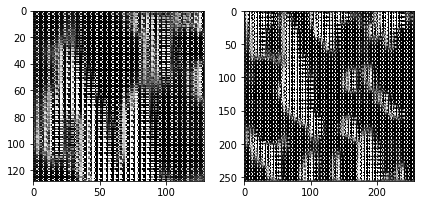

9700
discriminator loss: -0.06448136
adversarial loss: 5.2039223e-07


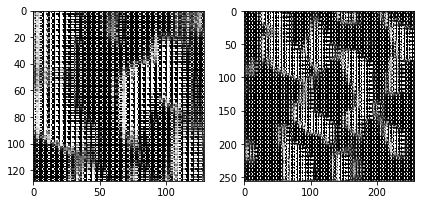

9800
discriminator loss: 0.028942358
adversarial loss: 1.0848621e-07


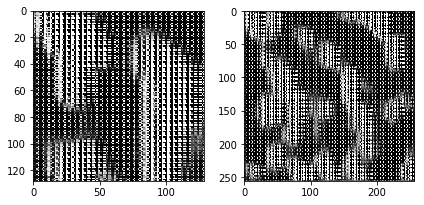

9900
discriminator loss: -0.0031192184
adversarial loss: 1.0000001e-07


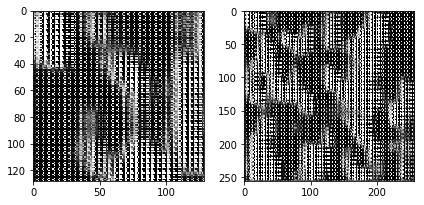

In [8]:
import time
import os
import skvideo.io

save_dir = '/../../../../newvolume/gen_videos'
if not os.path.exists(save_dir):
    os.mkdir(save_dir)

losses = {"discriminator loss": [], "adversarial loss": []}
for epoch in range(NUM_EPOCHS):
    
    batch_videos = sess.run(next_batch)
    generator_input = np.random.normal(size=(BATCH_SIZE, 100))
    generated_videos = generator.predict(generator_input)
    combined_videos = np.concatenate([generated_videos, batch_videos])
    
    labels = np.concatenate([np.ones((BATCH_SIZE,1)), np.zeros((BATCH_SIZE,1))])
    labels += 0.05 * np.random.random(labels.shape)
    
    d_loss = discriminator.train_on_batch(combined_videos, labels)
    
    generator_input = np.random.normal(size=(BATCH_SIZE, 100))
    misleading_targets = np.zeros((BATCH_SIZE,1))
    
    a_loss = gan.train_on_batch(generator_input, misleading_targets)
    
    losses["discriminator loss"].append(d_loss)
    losses["adversarial loss"].append(a_loss)
    
    if epoch % 100 == 0:
        gan.save_weights('gan_2.h5')
        discriminator.save_weights('discriminator_2.h5')
        generator.save_weights('generator_2.h5')
        print(epoch)
        print('discriminator loss:', d_loss)
        print('adversarial loss:', a_loss)
        show_sample(generated_videos[0][16].reshape((256, 256)), generated_videos[10][16].reshape((256, 256)))
        for i in range(20):
            video = ((generated_videos[i] - generated_videos[i].min()) * (1/(generated_videos[i].max() - generated_videos[i].min()) * 255)).astype('uint8')
            skvideo.io.vwrite(os.path.join(save_dir, "generated_video_{}.mp4".format(i)), video)

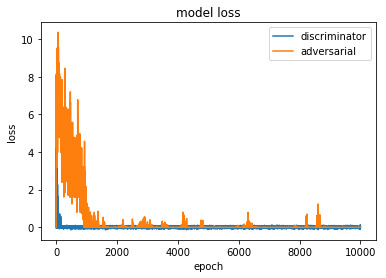

In [9]:
plt.plot(losses["discriminator loss"])
plt.plot(losses["adversarial loss"])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['discriminator', 'adversarial'], loc='upper right')
plt.show()

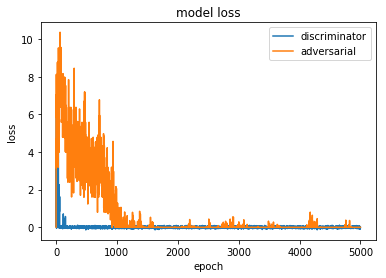

In [10]:
plt.plot(losses["discriminator loss"][0:5000])
plt.plot(losses["adversarial loss"][0:5000])
plt.title('model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['discriminator', 'adversarial'], loc='upper right')
plt.show()

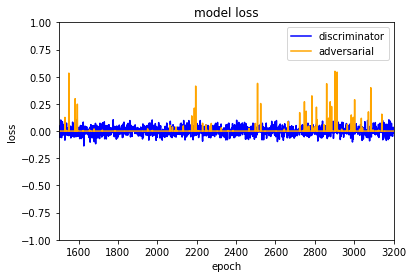

In [12]:
fig, ax = plt.subplots(1)
ax.plot(losses["discriminator loss"], color='blue')
ax.plot(losses["adversarial loss"], color='orange')
ax.set_title('model loss')
ax.set_ylabel('loss')
ax.set_xlabel('epoch')
ax.set_xlim(xmin=1500, xmax=3200)
ax.set_ylim(ymin=-1, ymax=1)
ax.legend(['discriminator', 'adversarial'], loc='upper right')
plt.show(fig)

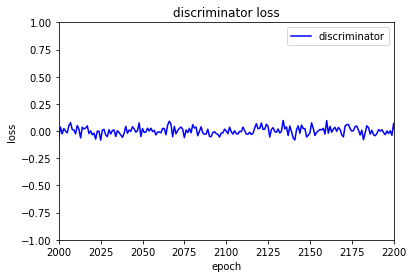

In [13]:
fig, ax = plt.subplots(1)
ax.plot(losses["discriminator loss"], color='blue')
ax.set_title('discriminator loss')
ax.set_ylabel('loss')
ax.set_xlabel('epoch')
ax.set_xlim(xmin=2000, xmax=2200)
ax.set_ylim(ymin=-1, ymax=1)
ax.legend(['discriminator'], loc='upper right')
plt.show(fig)

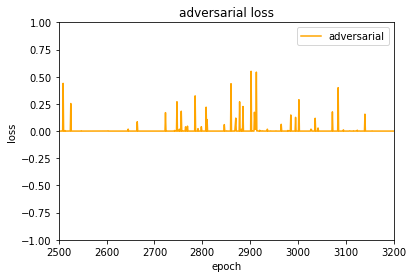

In [15]:
fig, ax = plt.subplots(1)
ax.plot(losses["adversarial loss"], color='orange')
ax.set_title('adversarial loss')
ax.set_ylabel('loss')
ax.set_xlabel('epoch')
ax.set_xlim(xmin=2500, xmax=3200)
ax.set_ylim(ymin=-1, ymax=1)
ax.legend(['adversarial'], loc='upper right')
plt.show(fig)

In [31]:
import imageio

generator.load_weights('generator_2.h5')
generator_input = np.random.normal(size=(1, 100))
video = generator.predict(generator_input)[0]
video = ((video - video.min()) * (1/(video.max() - video.min()) * 255)).astype('uint8')
imageio.mimwrite('generated_video.mp4', video, fps=32.0)